In [1]:
import pandas as pd
import numpy as np

# Load the CSV file into a DataFrame
csv_path = 'Data/Florian_Wirtz_eigentlich_noch_was_mit_der_v2.csv'
data_df = pd.read_csv(csv_path)

pd.set_option('display.max_columns', None)  # To display all columns
pd.set_option('display.max_rows', None)
data_df

,Nationality,Department,Program,Applications 2019,Offers 2019,Entrances 2019,Applications 2020,Offers 2020,Entrances 2020,Applications 2021,Offers 2021,Entrances 2021,Applications 2022,Offers 2022,Entrances 2022,Applications 2023,Offers 2023,Entrances 2023
0,Afghan,Accounting,UG Degree,0.0,0.0,0.0,2.5,2.5,0.0,2.5,0.0,0.0,2.5,2.5,0.0,6.0,0.0,0.0
1,Afghan,Accounting,PG Taught,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,0.0,0.0,0.0,0.0,0.0
2,Afghan,Anthropology,UG Degree,2.5,0.0,0.0,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,2.5,0.0
3,Afghan,Economic History,UG Degree,2.5,0.0,0.0,2.5,0.0,0.0,2.5,2.5,0.0,0.0,0.0,0.0,2.5,0.0,0.0
4,Afghan,Economic History,PG Taught,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,Afghan,Economics,UG Degree,0.0,0.0,0.0,2.5,0.0,0.0,2.5,0.0,0.0,2.5,0.0,0.0,2.5,0.0,0.0
6,Afghan,Economics,PG Taught,0.0,0.0,0.0,2.5,0.0,0.0,2.5,0.0,0.0,2.5,0.0,0.0,0.0,0.0,0.0
7,Afghan,European Institute,PG Taught,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.5,2.5,2.5,2.5,0.0,0.0
8,Afghan,Finance,UG Degree,2.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,Afghan,Finance,PG Taught,2.5,0.0,0.0,0.0,0.0,0.0,2.5,0.0,0.0,8.0,0.0,0.0,5.0,0.0,0.0


In [2]:
grouped_df = data_df.groupby(['Department', 'Program']).sum()

# Resetting the index to make the grouped columns as regular columns
grouped_df.reset_index(inplace=True)


row_sums = grouped_df.sum(axis=1)

# Filtering rows where the sum across the row is greater than or equal to 100
filtered_df = grouped_df[row_sums >= 250]
filtered_df.reset_index(drop=True, inplace=True)

filtered_df.iloc[:, 2:] = filtered_df.iloc[:, 2:].apply(pd.to_numeric, errors='coerce').fillna(0).astype(int)

filtered_df

/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/944187678.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = data_df.groupby(['Department', 'Program']).sum()
/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/944187678.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  row_sums = grouped_df.sum(axis=1)
/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/944187678.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyda

,Department,Program,Applications 2019,Offers 2019,Entrances 2019,Applications 2020,Offers 2020,Entrances 2020,Applications 2021,Offers 2021,Entrances 2021,Applications 2022,Offers 2022,Entrances 2022,Applications 2023,Offers 2023,Entrances 2023
0,Accounting,PG Taught,601,255,185,572,259,162,533,264,182,530,242,160,514,220,139
1,Accounting,UG Degree,1716,295,135,1799,337,162,1889,196,138,1984,293,131,1944,287,134
2,Anthropology,PG Taught,455,223,107,567,310,150,610,289,129,669,270,118,647,295,143
3,Anthropology,UG Degree,600,222,78,590,256,87,642,187,81,716,263,93,710,230,83
4,Economic History,PG Taught,543,203,115,595,245,155,654,219,122,914,289,164,818,274,167
5,Economic History,UG Degree,703,160,92,764,163,107,1050,118,83,999,151,90,959,151,86
6,Economics,PG Taught,1779,589,235,1833,694,265,1916,558,236,1795,644,219,1588,619,208
7,Economics,UG Degree,2272,287,143,2634,262,157,3046,202,124,2874,258,155,2619,241,134
8,European Institute,PG Taught,896,395,262,851,429,314,899,411,294,827,420,262,833,438,287
9,Finance,PG Taught,2084,321,179,2035,394,207,2200,399,182,2080,371,199,2073,375,218


In [3]:
entrances_columns = [col for col in filtered_df.columns if 'Entrances' in col]

# Create a new DataFrame with the first two columns and columns containing "Entrances"
entrances_df = filtered_df[['Department', 'Program'] + entrances_columns]
entrances_df

,Department,Program,Entrances 2019,Entrances 2020,Entrances 2021,Entrances 2022,Entrances 2023
0,Accounting,PG Taught,185,162,182,160,139
1,Accounting,UG Degree,135,162,138,131,134
2,Anthropology,PG Taught,107,150,129,118,143
3,Anthropology,UG Degree,78,87,81,93,83
4,Economic History,PG Taught,115,155,122,164,167
5,Economic History,UG Degree,92,107,83,90,86
6,Economics,PG Taught,235,265,236,219,208
7,Economics,UG Degree,143,157,124,155,134
8,European Institute,PG Taught,262,314,294,262,287
9,Finance,PG Taught,179,207,182,199,218


In [4]:
data_df = pd.read_csv("Data/countryEUindicator.csv")
# Filter to include only entries where 'EU' column is 'Yes'
eu_filtered_df = data_df[data_df['EU'] == 'Yes']

# Group by 'Department' and 'Program', then sum the numerical columns
eu_grouped_df = eu_filtered_df.groupby(['Department', 'Program']).sum()

# Reset the index to turn the grouping columns back into regular columns
eu_grouped_df.reset_index(inplace=True)

# Calculate the sum across each row
row_sums = eu_grouped_df.sum(axis=1)

# Filter rows where the sum across the row is greater than or equal to 250
filtered_df_eu = eu_grouped_df[row_sums >= 250]
filtered_df_eu.reset_index(drop=True, inplace=True)

# Convert remaining data to numeric, handle non-numeric entries, and fill missing values with zeros
filtered_df_eu.iloc[:, 2:] = filtered_df_eu.iloc[:, 2:].apply(pd.to_numeric, errors='coerce').fillna(0).astype(int)

# Display the filtered DataFrame
filtered_df_eu


/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/3166714359.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  eu_grouped_df = eu_filtered_df.groupby(['Department', 'Program']).sum()
/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/3166714359.py:12: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  row_sums = eu_grouped_df.sum(axis=1)
/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/3166714359.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

,Department,Program,Applications 2019,Offers 2019,Entrances 2019,Applications 2020,Offers 2020,Entrances 2020,Applications 2021,Offers 2021,Entrances 2021,Applications 2022,Offers 2022,Entrances 2022,Applications 2023,Offers 2023,Entrances 2023
0,Accounting,PG Taught,153,82,60,170,98,63,146,89,57,139,62,44,155,78,49
1,Accounting,UG Degree,188,30,17,215,33,30,172,22,12,168,37,15,202,28,12
2,Anthropology,PG Taught,34,25,17,50,30,22,22,15,15,38,27,17,25,17,10
3,Anthropology,UG Degree,86,26,10,82,32,15,68,17,12,68,30,12,72,25,10
4,Economic History,PG Taught,83,53,32,75,45,37,56,28,17,78,49,25,71,49,32
5,Economic History,UG Degree,99,20,20,114,28,22,144,17,12,120,20,10,119,27,20
6,Economics,PG Taught,230,95,44,269,121,52,245,90,42,219,115,40,213,106,49
7,Economics,UG Degree,536,37,15,564,30,17,505,26,20,492,33,20,462,37,15
8,European Institute,PG Taught,372,189,151,305,201,169,329,182,157,347,210,146,334,194,152
9,Finance,PG Taught,566,138,80,595,158,103,574,152,72,550,154,84,561,151,88


In [6]:
entrances_columns = [col for col in filtered_df_eu.columns if 'Entrances' in col]

# Create a new DataFrame with the first two columns and columns containing "Entrances"
entrances_df_eu = filtered_df_eu[['Department', 'Program'] + entrances_columns]

second_column_name = entrances_df_eu.columns[1]  # Adjust the index if your column order is different
entrances_df_eu[second_column_name] = entrances_df_eu[second_column_name].str.replace("PG Taught", "PG", regex=False)
entrances_df_eu[second_column_name] = entrances_df_eu[second_column_name].str.replace("UG Degree", "UG", regex=False)


first_column_name = entrances_df_eu.columns[0]  # Adjust the index if your column order is different
entrances_df_eu[first_column_name] = entrances_df_eu[first_column_name].str.replace("And", "and", regex=False)
entrances_df_eu = entrances_df_eu.rename(columns={'Program': 'Level'})

path = "Data/EU_Entrances_Question_Three.csv"

entrances_df_eu.to_csv(path, index=False)

print(f"EU Entrances for all programmes saved to {path}")

entrances_df_eu

EU Entrances for all programmes saved to Data/EU_Entrances_Question_Three.csv


/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/334268237.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entrances_df_eu[second_column_name] = entrances_df_eu[second_column_name].str.replace("PG Taught", "PG", regex=False)
/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/334268237.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entrances_df_eu[second_column_name] = entrances_df_eu[second_column_name].str.replace("UG Degree", "UG", regex=False)
/var/folders/w_/ccm86j

,Department,Level,Entrances 2019,Entrances 2020,Entrances 2021,Entrances 2022,Entrances 2023
0,Accounting,PG,60,63,57,44,49
1,Accounting,UG,17,30,12,15,12
2,Anthropology,PG,17,22,15,17,10
3,Anthropology,UG,10,15,12,12,10
4,Economic History,PG,32,37,17,25,32
5,Economic History,UG,20,22,12,10,20
6,Economics,PG,44,52,42,40,49
7,Economics,UG,15,17,20,20,15
8,European Institute,PG,151,169,157,146,152
9,Finance,PG,80,103,72,84,88


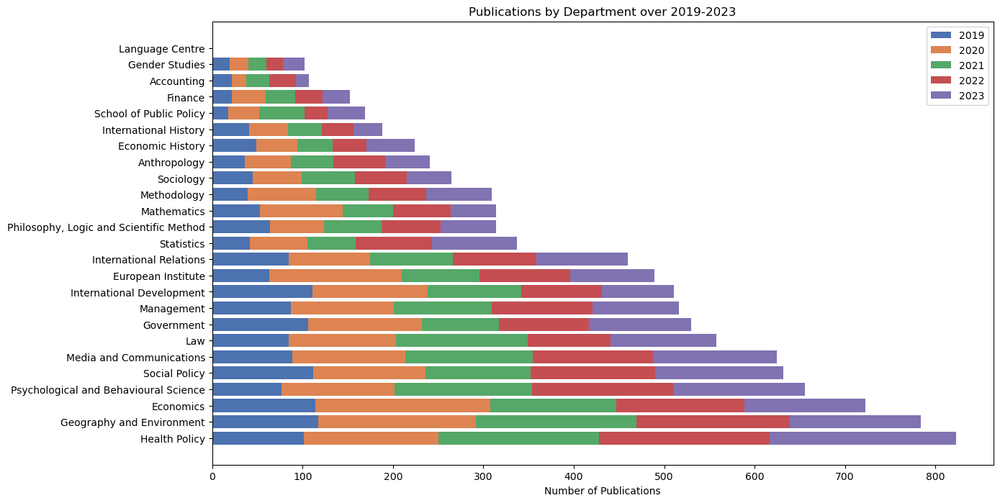

In [10]:


publications = pd.read_csv("Data/department_yearly_results.csv")
publications['Department'] = publications['Department'].str.replace('&', 'and')
years_to_drop = [str(year) for year in range(2010, 2019)]
publications = publications.drop(columns=years_to_drop)

# Convert years columns to numeric, replacing non-numeric entries with NaNs
years = ['2019', '2020', '2021', '2022', '2023']
for year in years:
    publications[year] = pd.to_numeric(publications[year], errors='coerce')

publications['Total'] = publications[years].sum(axis=1)
publications = publications.sort_values(by='Total', ascending=False)
publications = publications.reset_index(drop=True)

fig, ax = plt.subplots(figsize=(14, 8))
indices = np.arange(len(publications['Department']))
colors = ['#4c72b0', '#dd8452', '#55a868', '#c44e52', '#8172b2']
widths = [np.nan_to_num(publications[year].astype(float)) for year in years]

cumulative_width = np.zeros(len(publications))
for width, color, year in zip(widths, colors, years):
    ax.barh(indices, width, color=color, label=year, left=cumulative_width)
    cumulative_width += width

ax.set(yticks=indices, yticklabels=publications['Department'])
ax.set_xlabel('Number of Publications')
ax.set_title('Publications by Department over 2019-2023')
ax.legend()

plt.show()


The horizontally stacked bar chart above visualises the number of annual publications of different departments over the years 2019 to 2023. 

While the relative ranking of departments by the number of publications appears relatively stable, there are exceptions with notable increases and fluctuations, particularly around 2021. Departments such as Gender Studies, Law, and Economics showed a significant increase in publications during this year. The increase is visually identifiable by a longer green section compared to the blue and orange ones. On the other hand some department's publicaiton output decreased from 2020 to 2021.

This might be a direct consequence as through the change in tuition fees in 2021 due to Brexit, the fees that these departments collected might have changed significantly and as a result their funding avaiable for research increased or decreasing accordingly.

However this analysis is limited in the sense that there are many other factors that could have caused these changes in 2021. Particularly the trend for each department depends on  its size, funding, and the nature of the research field itself. Thus it is hard to directly identify the changed tuition fee structure of Brexit as the cause of this change in trend. Therefore a more rigorous analysis is required.



In [14]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

final_merged_fees = pd.read_csv("Data/TuitionFees/FinalTableFees.csv")
final_merged_fees = final_merged_fees[final_merged_fees['Department'] != "Department not found"]
final_merged_fees['Department'] = final_merged_fees['Department'].str.replace("Department of ", "", regex=False)

second_column_name = final_merged_fees.columns[1]  # Adjust the index if your column order is different
final_merged_fees[second_column_name] = final_merged_fees[second_column_name].str.replace("Undergraduate", "UG", regex=False)
final_merged_fees[second_column_name] = final_merged_fees[second_column_name].str.replace("Postgraduate", "PG", regex=False)
final_merged_fees.columns = final_merged_fees.columns.str.replace("_", " ", regex=False)

final_merged_fees.drop(final_merged_fees.columns[2], axis=1, inplace=True)
final_merged_fees.drop(final_merged_fees.columns[7], axis=1, inplace=True)

final_merged_fees.reset_index(drop=True, inplace=True)

entrances_df_eu = pd.read_csv("Data/EU_Entrances_Question_Three.csv")
extra_eu_fees_merged = pd.merge(final_merged_fees, entrances_df_eu, on=['Department', 'Level'], suffixes=('_fees', '_entrances'))

extra_eu_fees_result = extra_eu_fees_merged[['Department', 'Level']].copy()
years = ['2019', '2020', '2021', '2022', '2023']
for year in years:
    fee_col = f'Fee Difference {year}'
    entrance_col = f'Entrances {year}'
    extra_eu_fees_result[f'Extra Fees through EU {year}'] = extra_eu_fees_merged[fee_col] * extra_eu_fees_merged[entrance_col]

year_columns = ['Extra Fees through EU 2019', 'Extra Fees through EU 2020', 'Extra Fees through EU 2021', 'Extra Fees through EU 2022', 'Extra Fees through EU 2023']
for column in year_columns:
    extra_eu_fees_result[column] = extra_eu_fees_result[column].astype(int)

extra_eu_fees_result = extra_eu_fees_result.drop('Level', axis=1)
new_dataframe = extra_eu_fees_result.groupby('Department')[year_columns].sum()
new_dataframe

,Extra Fees through EU 2019,Extra Fees through EU 2020,Extra Fees through EU 2021,Extra Fees through EU 2022,Extra Fees through EU 2023
Department,,,,,
Accounting,214510,405888,192360,238656,228624
Anthropology,236852,360096,282720,315840,249500
Economic History,458392,565856,299328,356800,612760
Economics,176242,229408,280400,294080,276006
European Institute,0,0,0,0,0
Finance,160050,271040,289960,352000,468234
Gender Studies,191400,326688,307248,216000,237000
Geography and Environment,791682,823149,537004,631444,695832
Government,981288,972288,937672,281600,607022


Now the publication data will be merged with the data on the extra fees that were collected from EU students:

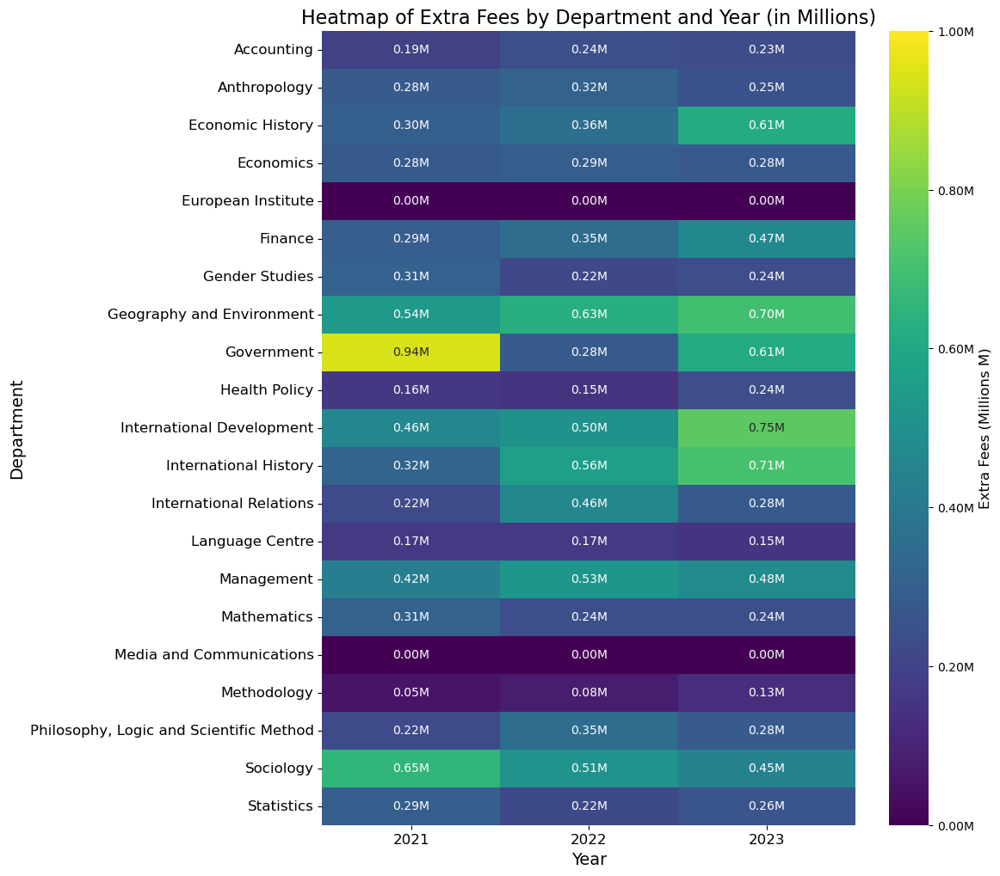

In [11]:
department_fees_publications_df = pd.merge(publications, new_dataframe, on='Department', how='inner')

# Extract the column names
column_names = department_fees_publications_df.columns

# Reorganize the column names
new_column_order = ['Department']
for year in range(2019, 2024):
    new_column_order.append(str(year))
    new_column_order.append(f'Extra Fees through EU {year}')

# Reorder the DataFrame columns
department_fees_publications_df = department_fees_publications_df[new_column_order]

renamed_columns = {}
for column in department_fees_publications_df.columns:
    if column.isdigit():
        renamed_columns[column] = f'Publications {column}'

department_fees_publications_df = department_fees_publications_df.rename(columns=renamed_columns)
columns_to_drop = department_fees_publications_df.columns[department_fees_publications_df.columns.str.contains('2019|2020')]
department_fees_publications_df = department_fees_publications_df.drop(columns=columns_to_drop)

# Correct the script based on the printed column names
import seaborn as sns
import matplotlib.pyplot as plt

# Correctly referencing DataFrame and column names
heatmap_data = department_fees_publications_df.pivot_table(index="Department", values=['Extra Fees through EU 2021', 'Extra Fees through EU 2022', 'Extra Fees through EU 2023'], aggfunc='sum') / 1_000_000  # Convert to millions
fig, ax = plt.subplots(figsize=(10, 12))
heat_map = sns.heatmap(heatmap_data, ax=ax, annot=True, fmt=".2f", cmap='viridis', annot_kws={'size':10}, vmax=1.00)
ax.set_title('Heatmap of Extra Fees by Department and Year (in Millions)', fontsize=16)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Department', fontsize=14)
ax.set_xticklabels(['2021', '2022', '2023'], rotation=0, fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

# Annotate each cell with "M"
for text in ax.texts:
    text.set_text(text.get_text() + "M")

# Adjusting the colorbar labels to exclude values over 1.00M
colorbar = ax.collections[0].colorbar
colorbar.set_label('Extra Fees (Millions M)', fontsize=12)
colorbar.set_ticks([x for x in colorbar.get_ticks() if x <= 1.00])
colorbar.set_ticklabels([f"{x:.2f}M" for x in colorbar.get_ticks()])

plt.show()


The heatmap above provides an initial insight into which departments have benefited most from the changes in tuition fee structures following Brexit. It was generated by calculating the increase in fees paid by EU students, defined as the difference between the overseas fee and the home fee, and then multiplying this by the number of EU entrants to these departments over the specified years. This effectively represents the total increase in tuition fees received from EU students by each department

Immediately the yellow government field stands out which showed that the government department incurred an additional 1 million pounds in tuition fees from European students in 2021. However, this result appears to be an anomaly as it declines quickly in the following year before increasing again so its hard to interpret this more comprehensively.

However as this heatmap does not provide any information on department size it does not make sense to look at absolute values further because it is uncertain whether high numbers are a result of high number of EU entrants or high fees. 

Certain departments such as Finance, Geography, Economic histroy and international development showed consistent growth througout these periods. This suggests that these courses have increased in popularity among EU students despite them now paying more fees for these courses. This is an important metric for LSE as it can perhaps see what makes these courses increase in attractiveness despite raised fees to ensure the university can continue attracting good talent.

While it is hard to find more general trends and there seem to be much fluctuations across departments, the overall trend can be considered to be increasing. This again implies that LSE continues to attract EU students after the changed tuition fees. 

Moreover as the tuition fee structure only changed for students entering in 2021 there is not that much historical data from which trends can be interpreted more clearly. Moreover, it is uncertain how this increase in fees is allocated across departments, for example whether it goes into research, etc. Even more importantly this does not provide any insights into the total fees generated by each department which is arguably the more important metric. For example perhaps following Brexit these departments generated more fees from EU students but overall their collected fees went down due to other reasons.

In [12]:
# Prepare a new DataFrame to hold transformed data
new_rows = []

# Loop through each year and create new rows
for year in [2021, 2022, 2023]:
    temp_df = department_fees_publications_df[['Department', f'Publications {year}', f'Extra Fees through EU {year}']].copy()
    temp_df['Year'] = year
    temp_df.rename(columns={f'Publications {year}': 'Publications',
                            f'Extra Fees through EU {year}': 'Extra Fees'}, inplace=True)
    temp_df['Department'] = temp_df['Department'] + ' ' + str(year)
    new_rows.append(temp_df)

# Concatenate all new rows
long_publications_extraFees_df = pd.concat(new_rows)

# Sort and reset index for better readability
long_publications_extraFees_df = long_publications_extraFees_df.sort_values(by=['Department']).reset_index(drop=True)

long_publications_extraFees_df.drop(columns=['Year'], inplace=True)
long_publications_extraFees_df

,Department,Publications,Extra Fees
0,Accounting 2021,25.0,192360
1,Accounting 2022,30.0,238656
2,Accounting 2023,14.0,228624
3,Anthropology 2021,47.0,282720
4,Anthropology 2022,57.0,315840
5,Anthropology 2023,50.0,249500
6,Economic History 2021,39.0,299328
7,Economic History 2022,38.0,356800
8,Economic History 2023,53.0,612760
9,Economics 2021,139.0,280400


As previously mentioned, it is hard to determine how the increased tuition fees generated from EU students is allocated within departments. We will now try to examine this more precisely.

Research notably is a very important component of any university department. We try to proxy for research using the number of publications of each department as a higher number of publications indicates a higher research activity.


NUR PAAR JAHRE, VLLT IST DER EFFEKT AUF RESEARCH MIT EINEM LAG DA RESEARCH JA RELATIV LANG DAUERN KANN UND DESHALB MAN DAS EHER NACH PAAR JAHREN SEHEN KANN

In [13]:
import statsmodels.api as sm
import plotly.express as px

# Assuming long_publications_extraFees_df is already loaded

# Convert data types to float (if they are not already floats)
long_publications_extraFees_df['Extra Fees'] = pd.to_numeric(long_publications_extraFees_df['Extra Fees'], errors='coerce')
long_publications_extraFees_df['Publications'] = pd.to_numeric(long_publications_extraFees_df['Publications'], errors='coerce')

# Drop any rows with missing data after the conversion
long_publications_extraFees_df = long_publications_extraFees_df.dropna()

# Perform linear regression
X = sm.add_constant(long_publications_extraFees_df['Extra Fees'])  # adding a constant
model = sm.OLS(long_publications_extraFees_df['Publications'], X).fit()

# Print the regression summary
print(model.summary())

# Plotting the result without text parameter
fig = px.scatter(long_publications_extraFees_df, x='Extra Fees', y='Publications', trendline="ols",
                 labels={"Extra_Fees": "Extra Fees", "Publications": "Publications"},
                 title="Regression of Publications on Extra Fees")

# Customizing hover data to only show department name when hovered over
fig.update_traces(
    hovertemplate="Extra Fees: %{x}<br>Publications: %{y}<br>Department: %{text}"
)

# Adding the department names as hover text
fig.add_scatter(x=long_publications_extraFees_df['Extra Fees'], y=long_publications_extraFees_df['Publications'],
                mode='markers', hoverinfo='text', text=long_publications_extraFees_df['Department'],
                showlegend=False)

# Update layout for centered title
fig.update_layout(
    title={
        'text': "Regression of Publications on Extra Fees through EU students",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    hovermode="closest"
)

fig.show()


                            OLS Regression Results                            
Dep. Variable:           Publications   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.015
Method:                 Least Squares   F-statistic:                    0.1464
Date:                Mon, 29 Apr 2024   Prob (F-statistic):              0.703
Time:                        15:52:32   Log-Likelihood:                -315.75
No. Observations:                  60   AIC:                             635.5
Df Residuals:                      58   BIC:                             639.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         85.5142     11.591      7.377      0.0

The above regresses the number of publications on the additional fees generated by EU students across departments through the years 2021 to 2023. This is meant to examine whether a higher extra fees generated EU students in a particular years corresponds to a higher number of publications of that department within a particular year. Continuing the notion of publications proxying research, the idea here is that if there would be a positive regression coefficient it would imply that these additional fees are allocated towards research.

However, as already seen by just inspecting the dots across the graph, these are scattered without indication of any trend. This is confirmed by the coefficient of extra fees being almost 0 and not significant at all (p-value is much higher than even 10%). 

Therefore, no trend can be interpreted from this graph and a higher amount of fees generated by EU students does not seem to result in more/less research. Thus, the data is still not revealing of how these additional fees are allocated. 

At least from this simplified lense the effect of changed tuition structure due to Brexit did not seem to impact research of these departments. 

In [16]:
import pandas as pd

# Load data
country_eu_indicator = pd.read_csv('Data/countryEUindicator.csv')
final_merged_fees_all_years = pd.read_csv('Data/FinalMergedFeesAllYears.csv')



# Define the cleaning function for department names
def clean_department_name(name):
    # Standardize to "Department of X" format
    name = " ".join(name.title().split())  # Clean up extra spaces and capitalize correctly
    if not name.startswith("Department Of"):
        name = "Department of " + name
    return name.replace("Department Of ", "Department of ")

# Apply the cleaning function to the department names
country_eu_indicator['Department'] = country_eu_indicator['Department'].astype(str).apply(clean_department_name)
final_merged_fees_all_years['Department'] = final_merged_fees_all_years['Department'].astype(str).apply(clean_department_name)

# Identify the years 2019 to 2023 from the fee data columns
years = [year for year in range(2019, 2024)]

# Prepare the results DataFrame
results_df = pd.DataFrame()

# Calculate fees for each department and each year
for year in years:
    total_fees_by_department = {}
    for department in country_eu_indicator['Department'].unique():
        fee_data = final_merged_fees_all_years[
            (final_merged_fees_all_years['Department'] == department) &
            final_merged_fees_all_years['Level'].isin(['Undergraduate', 'Postgraduate'])
        ][['Level', f'Home Fee_{year}', f'Overseas Fee_{year}']].drop_duplicates()

        if not fee_data.empty:
            entries = country_eu_indicator[
                (country_eu_indicator['Department'] == department) &
                country_eu_indicator['Program'].str.contains('UG|PG', regex=True)
            ][['Nationality', 'Program', f'Entrances {year}', 'EU']].dropna()

            entries['Total Fees'] = entries.apply(
                lambda row: row[f'Entrances {year}'] * (
                    fee_data.loc[fee_data['Level'] == ('Undergraduate' if 'UG' in row['Program'] else 'Postgraduate'),
                                 f'Home Fee_{year}' if row['EU'] == 'Yes' and year <= 2020 else f'Overseas Fee_{year}'].iloc[0]
                    if not fee_data[fee_data['Level'] == ('Undergraduate' if 'UG' in row['Program'] else 'Postgraduate')].empty else 0),
                axis=1
            )
            total_fees_by_department[department] = entries['Total Fees'].sum()
        # Remove departments where fee data is not available
        elif department not in total_fees_by_department:
            total_fees_by_department[department] = "Fee data not available."

    # Append the results for the year to the results DataFrame
    year_results_df = pd.DataFrame.from_dict(total_fees_by_department, orient='index', columns=[year])
    results_df = pd.concat([results_df, year_results_df], axis=1)

# Display the final results table
results_df = results_df.loc[results_df.min(axis=1) != "Fee data not available."]  # Remove rows with fee data not available

results_df = results_df.loc[results_df.min(axis=1) != "Fee data not available."]  # Remove rows with fee data not available
results_df.reset_index(inplace=True)  # Reset the index

publications_departments = pd.read_csv("Data/department_yearly_results.csv")
publications_departments['Department'] = publications_departments['Department'].str.replace('&', 'and')
years_to_drop = [str(year) for year in range(2010, 2019)]
publications_departments = publications_departments.drop(columns=years_to_drop)


publications_departments.rename(columns=lambda x: f'Publications {x}' if x.isdigit() else x, inplace=True)

def modify_department_name(department):
    department = department.replace(" and ", " And ")  # Change "and" to "And"
    return "Department of " + department

# Apply the function to the "Department" column
publications_departments['Department'] = publications_departments['Department'].apply(modify_department_name)
publications_departments['Department'] = publications_departments['Department'].replace('Department of Law', 'Department of Law School')

# Merge the two DataFrames on their first columns
merged_df = pd.merge(publications_departments, results_df, left_on=publications_departments.columns[0], right_on=results_df.columns[0])

merged_df = merged_df.drop(columns=['index'])

for year in range(2019, 2024):
    merged_df.rename(columns={str(year): f'Fees {year}'}, inplace=True)

# Add "Fees " before the names of columns 7 to 11
for i in range(6, 11):
    merged_df.rename(columns={merged_df.columns[i]: f'Fees {merged_df.columns[i]}'}, inplace=True)
    
column_names = merged_df.columns

# Reorganize the column names
new_column_order = ['Department']
for year in range(2019, 2024):
    new_column_order.append(f'Publications {year}')
    new_column_order.append(f'Fees {year}')

# Reorder the DataFrame columns
merged_df = merged_df[new_column_order]

merged_df['Department'] = merged_df['Department'].str.replace("Department of ", "", regex=False)
merged_df['Department'] = merged_df['Department'].str.replace('And', 'and')
# Convert all columns to string type
merged_df = merged_df.astype(str)

# Check for rows containing the phrase "no results" in any column
rows_to_remove = merged_df.apply(lambda row: row.str.contains('no results')).any(axis=1)

# Remove rows containing the phrase "no results"
merged_df = merged_df[~rows_to_remove]
merged_df = merged_df.reset_index(drop=True)
merged_df

,Department,Publications 2019,Fees 2019,Publications 2020,Fees 2020,Publications 2021,Fees 2021,Publications 2022,Fees 2022,Publications 2023,Fees 2023
0,Geography and Environment,117,7185863.01,175,8366209.04,177,8548526.0,170,9115338.5,145,10136727.0
1,"Philosophy, Logic and Scientific Method",64,2109520.0,60,2664200.0,63,2274675.0,66,3429510.0,61,2376072.0
2,Government,106,7992932.0,126,8402907.0,85,9332575.0,100,8734595.0,113,11087736.0
3,Law School,85,2084755.0,118,2866515.0,146,2181355.0,92,2566300.0,117,2340096.0
4,Social Policy,112,6075856.0,124,6977112.0,116,6856915.0,138,7897205.0,142,7605580.0
5,Mathematics,53,4845876.0,91,5083634.0,56,5689975.0,64,4962779.0,50,5463696.0
6,Economic History,49,4127372.0,45,5396615.0,39,4759170.0,38,6122149.0,53,6467520.0
7,Sociology,45,6325642.199999999,54,7049405.6,59,8507661.8,57,8629584.0,50,8776316.0
8,International History,41,6077782.0,43,7081537.0,37,6628535.0,35,8583128.0,32,8991360.0
9,Statistics,42,3909342.0,63,4658145.0,54,4442240.0,84,5431879.0,94,6082824.0


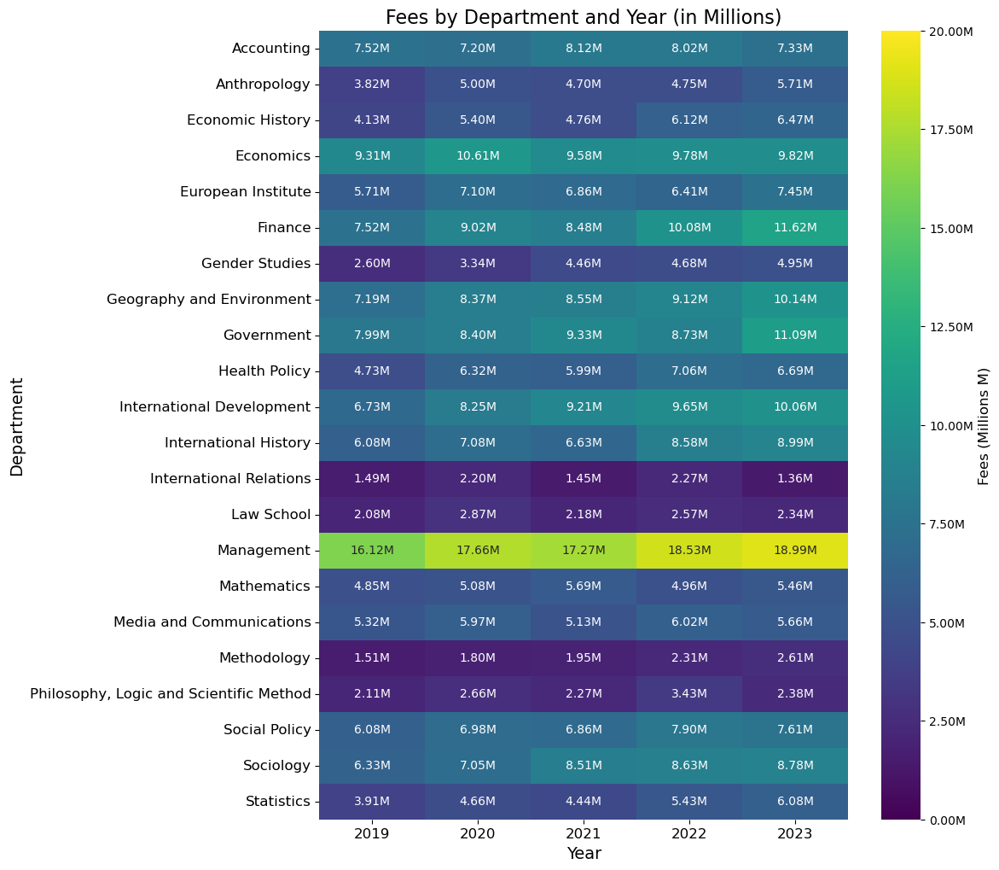

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert fees columns to numeric
fees_columns = ["Fees 2019", "Fees 2020", 'Fees 2021', 'Fees 2022', 'Fees 2023']
merged_df[fees_columns] = merged_df[fees_columns].apply(pd.to_numeric)

# Correctly referencing DataFrame and column names
heatmap_data = merged_df.pivot_table(index="Department", values=fees_columns, aggfunc='sum') / 1_000_000  # Convert to millions
fig, ax = plt.subplots(figsize=(10, 12))
heat_map = sns.heatmap(heatmap_data, ax=ax, annot=True, fmt=".2f", cmap='viridis', annot_kws={'size':10}, vmax=20, vmin=0) # Adjusted scale to 20M and set vmin to 0
ax.set_title('Fees by Department and Year (in Millions)', fontsize=16)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Department', fontsize=14)
ax.set_xticklabels(['2019', '2020', '2021', '2022', '2023'], rotation=0, fontsize=12)  # Adjusted number of tick labels
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

# Annotate each cell with "M"
for text in ax.texts:
    text.set_text(text.get_text() + "M")

# Adjusting the colorbar labels to exclude values over 20.00M
colorbar = ax.collections[0].colorbar
colorbar.set_label('Fees (Millions M)', fontsize=12)
colorbar.set_ticks([x for x in colorbar.get_ticks() if x <= 20.00])
colorbar.set_ticklabels([f"{x:.2f}M" for x in colorbar.get_ticks()])

plt.show()


The above heatmap represents the total fees collected by each department from 2020 to 2023, measured in millions of pounds (£M). The color intensity indicates the amount of fees collected, with darker colors representing higher fees.

From the graph it is visible that the overall trend across departments is fees collected increasing quite significantly over the the years, except for 2021 where the amount of fees collected decreased for most departments before increasing to levels higher than in the preceding years. As already discussed earlier, the amount of fees decreasing in 2021 is likely a result of this being the year after Covid and LSE admitted significantly less students than in prior years.

However, the values in 2022 and 2023 being higher than in the years leading up to 2021 suggests that this increase is in fact due to the changed tuition fee structure which now caused EU students to pay significantly more. As established previously, LSE continued to attract EU students, despite their increased tuition fees so this increase can be attributed to this. 

It is worth mentioning that the fees for international students have continuously increased through the years but the increase is not gradual enough throughout the years for this to be the sole reason. Notably this change may also be caused by the departments simply increasing in size. However, it is unlikely that the departments increased in size that much over a relatively short time span. Especially as there was Covid in between where it is unlikely that departments increased their size.

Therefore, this reveals that the changed tuition fee structure due to Brexit did in fact increase the amount of fees collected by the departments (in general). This again underlines that LSE remains attractive despite increased costs. Moreover, this means that as a result departments have more money available which they can allocate towards research or increasing their department etc. 

Thus if the additional fees truly go into research, we would expect for research to increase throughout the years. This will now be explored.

In [18]:
# Prepare a new DataFrame to hold transformed data
new_rows = []

# Loop through each year and create new rows
for year in [2019, 2020, 2021, 2022, 2023]:
    temp_df = merged_df[['Department', f'Publications {year}', f'Fees {year}']].copy()
    temp_df['Year'] = year
    temp_df.rename(columns={f'Publications {year}': 'Publications',
                            f'Fees {year}': 'Fees'}, inplace=True)
    temp_df['Department'] = temp_df['Department'] + ' ' + str(year)
    new_rows.append(temp_df)

# Concatenate all new rows
long_publications_fees_df = pd.concat(new_rows)

# Sort and reset index for better readability
long_publications_fees_df = long_publications_fees_df.sort_values(by=['Department']).reset_index(drop=True)

# Show the resulting DataFrame
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
long_publications_fees_df['Fees'] = long_publications_fees_df['Fees'].astype(int)
long_publications_fees_df = long_publications_fees_df.drop(columns='Year')

import statsmodels.api as sm
import plotly.express as px

# Convert data types to float (if they are not already floats)
long_publications_fees_df['Fees'] = pd.to_numeric(long_publications_fees_df['Fees'], errors='coerce')
long_publications_fees_df['Publications'] = pd.to_numeric(long_publications_fees_df['Publications'], errors='coerce')

# Drop any rows with missing data after the conversion
long_publications_fees_df = long_publications_fees_df.dropna()

# Perform linear regression
X = sm.add_constant(long_publications_fees_df['Fees'])  # adding a constant
model = sm.OLS(long_publications_fees_df['Publications'], X).fit()

# Print the regression summary
print(model.summary())

# Plotting the result without text parameter
fig = px.scatter(long_publications_fees_df, x='Fees', y='Publications', trendline="ols",
                 labels={"Fees": "Fees", "Publications": "Publications"},
                 title="Regression of Publications on Fees")

# Customizing hover data to only show department name when hovered over
fig.update_traces(
    hovertemplate="Fees: %{x}<br>Publications: %{y}<br>Department: %{text}"
)

# Adding the department names as hover text
fig.add_scatter(x=long_publications_fees_df['Fees'], y=long_publications_fees_df['Publications'],
                mode='markers', hoverinfo='text', text=long_publications_fees_df['Department'],
                showlegend=False)

# Update layout for centered title
fig.update_layout(
    title={
        'text': "Regression of Publications on Fees",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    hovermode="closest"
)

fig.show()


                            OLS Regression Results                            
Dep. Variable:           Publications   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.037
Method:                 Least Squares   F-statistic:                     5.228
Date:                Mon, 29 Apr 2024   Prob (F-statistic):             0.0242
Time:                        16:14:14   Log-Likelihood:                -573.29
No. Observations:                 110   AIC:                             1151.
Df Residuals:                     108   BIC:                             1156.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         65.2892      9.104      7.172      0.0

The graph above depicts a regression of the number of publications of departments on the amount of Fees generated by the departments for the years 2019 to 2023. 

From the graph its immediately apparent that there seems to be a positive trend. This is confirmed by a very small but importantly positive slope coefficient. Even more importantly this slope coefficient is significant at the commonly used 5% significance level (with a p-value of 0.033). This implies that there is a statistically significant positive relationship between fees collected and publications for a department (across these years).

This in turn indicates that at least part of the increased tuition fees that these departments generate (as discussed above) is allocated towards research which supports the natural assumption that departmental research also benefits from these increased tuition fees due to the brexit induced tuition fee change. 

Consequently, this seems to imply that LSE's research has benefitted from Brexit, at least in terms of finances. As better research helps contunue to attract students (even whilst fees are rising), this may result in a self perpetuating positive feedback cycle for LSE.

However, this statement must be expressed prudently. Primarily, just because a research department has more money available does not neccessarily mean that it's quality improves. Especially as due to Brexit some researchers feel less comfortable working in the UK as for example they may be worried about economic uncertainty or have some other issues that are Brexit related. This would halt these from going to the UK and thus LSE and perhaps the increased money is directed towards less competent research. Therefore, assessing how Brexit directly affects the quality of research must be conducted carefully.

Now to analyse this effect on a more cumulative level we take the sum of publications and total fees collected by these departments over the years to determine a more general picture on the effect of fees on publications. This in turn will allow us to examine the effect of Brexit on LSE more rigorously as the main impact of Brexit, at least financially, was the changed tuition fee structure.

In [19]:
# Remove the year from the Department column
long_publications_fees_df['Department'] = long_publications_fees_df['Department'].str.replace(r'\d+', '')

# Group by Department and sum up the rows
summed_publications_fees_df = long_publications_fees_df.groupby('Department', as_index=False).sum()

# Show the resulting DataFrame
summed_publications_fees_df = summed_publications_fees_df.rename(columns={'Publications': 'Total Publications', 'Fees': 'Total Fees'})

summed_publications_fees_df

/var/folders/w_/ccm86j116md1g5bmpdbhyv5r0000gn/T/ipykernel_88523/1572770423.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



,Department,Total Publications,Total Fees
0,Accounting,107,38178028
1,Anthropology,241,23981630
2,Economic History,224,26872826
3,Economics,723,49095940
4,European Institute,489,33522264
5,Finance,152,46733770
6,Gender Studies,102,20033088
7,Geography and Environment,784,43352663
8,Government,530,45550745
9,Health Policy,823,30795764


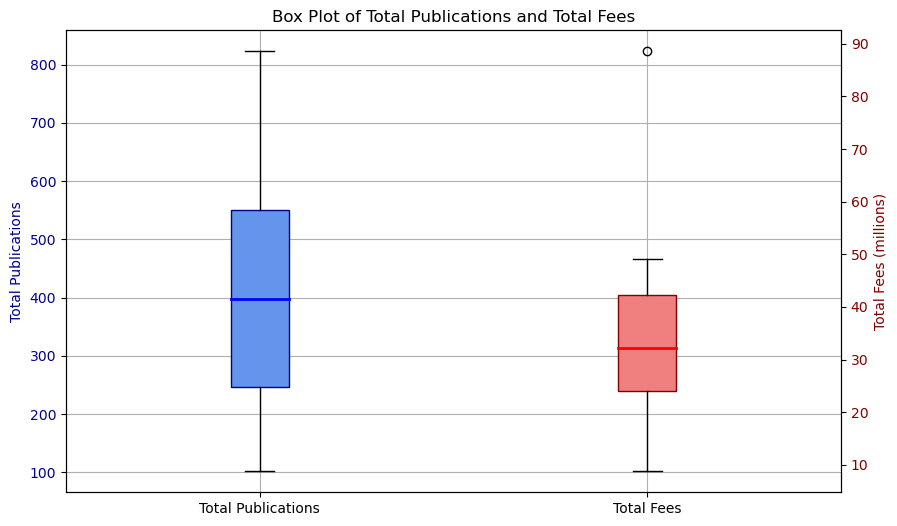

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np



# Plotting the box plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting the Total Publications box plot on the left y-axis
bp1 = ax1.boxplot(summed_publications_fees_df['Total Publications'], positions=[1], labels=['Total Publications'], patch_artist=True, boxprops=dict(facecolor='cornflowerblue', color='darkblue'))
ax1.set_ylabel('Total Publications', color='darkblue')
ax1.tick_params(axis='y', labelcolor='darkblue')
ax1.grid(True)

# Setting the color of the median line for Total Publications
for median in bp1['medians']:
    median.set(color='blue', linewidth=2)

# Creating a twin axis for Total Fees on the right side
ax2 = ax1.twinx()
# Plotting the Total Fees box plot on the right y-axis
bp2 = ax2.boxplot(summed_publications_fees_df['Total Fees'] / 1000000, positions=[2], labels=['Total Fees (millions)'], patch_artist=True, boxprops=dict(facecolor='lightcoral', color='maroon'))
ax2.set_ylabel('Total Fees (millions)', color='maroon')
ax2.tick_params(axis='y', labelcolor='maroon')

# Setting the color of the median line for Total Fees
for median in bp2['medians']:
    median.set(color='red', linewidth=2)

# Set x-axis ticks
ax1.set_xticks([1, 2])
ax1.set_xticklabels(['Total Publications', 'Total Fees'])

plt.title('Box Plot of Total Publications and Total Fees')
plt.show()


From the graph it is visible that publications is much more variable than total fees. This makes sense given the fact that the tuition fee is always in a somewhere similar range across courses of different departments and generally the departments do not vary that significantly in size (especially as management has been excluded as an outlier). 

In comparison, total publications being more variable also makes sense as departments vary alot in how research based they are, so even if a department were to gain higher fees this does not automatically mean this would be allocated towards research.

Therefore we need to be careful about how we interpret the effect of the change in tution fee structure due to brexit on research as a main component of this effect is how research based these departments are which can vary significantly.

Also before doing any further analysis it is worth visualizing how exactly the fees and publications are allocated across departments:

In [21]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Creating the dataframe
data = {
    'Department': ['Accounting', 'Anthropology', 'Economic History', 'Economics', 'European Institute',
                   'Finance', 'Gender Studies', 'Geography and Environment', 'Government', 'Health Policy',
                   'International Development', 'International History', 'International Relations', 'Law School',
                   'Management', 'Mathematics', 'Media and Communications', 'Methodology',
                   'Psychological and Behavioural Science', 'Social Policy', 'Sociology', 'Statistics'],
    'Total Publications': [107, 241, 222, 723, 488, 152, 102, 784, 530, 822, 511, 188, 460, 558, 515,
                           314, 625, 309, 656, 632, 265, 337],
    'Total Fees': [41658171, 9608425, 26984815, 49293535, 33581064, 43890814, 20091888, 43717849,
                    46499851, 28769896, 43850826, 37362342, 8775428, 12222151, 94804078, 26104285,
                    28091976, 11705208, 34486600, 35698998, 41541373, 28370909]
}

summed_publications_fees_df = pd.DataFrame(data)

# Create interactive pie chart for Total Publications
fig_pub = go.Figure(go.Pie(labels=summed_publications_fees_df['Department'], values=summed_publications_fees_df['Total Publications']))
fig_pub.update_layout(title='Distribution of Total Publications')

# Create interactive pie chart for Total Fees
fig_fees = go.Figure(go.Pie(labels=summed_publications_fees_df['Department'], values=summed_publications_fees_df['Total Fees']))
fig_fees.update_layout(title='Distribution of Total Fees')

# Displaying the pie charts
fig_pub.show()
fig_fees.show()


From the first pie chart it becomes apparent that research (or at least research proxied by publications) is dominated by a couple of departments such as health policy, geography and economics. This again indicates that different departments place different emphasis on research although this is not immediately obvious from this pie chart as this does not reveal the size of an deparment which is also a major component of its research capabilities. However, in these departments with a high output of research (relative to other departments) it is likely that the effect of higher tuition fees through the brexit induced tuition fee structure has had a positive impact on research.

When looking at the distribution of total fees, as before, management stands out with collecting the highest amount of fees by far. This is likely the consequence of two main factors. Primarily management is a huge department but also it has a very high proportion of EU students. As these EU students now pay more it makes sense that management collects so much total fees. However, as the amount of fees collected by management was already high leading up to 2021 and they actually did not collect that much more additional fees (recall from earlier when examined the amount of additional fees generated by EU students after the tuition structure change) this sugggests that this high fee collection is mainly driven by the size of the department. This in turn indicates that the brexit induced tuition fee structure change may not have had such a significant effect as was assumed originally. 

Furthermore, while management collected by far the most fees it is only on 9th place in proportion of publications. This in addition to it being a huge department further underscores the point that higher fees does not neccessarily mean increased research which limits the validity of our initial analysis.

This can be further analysed by simply plotting the total fees against total publications for the departments across the time period.

In [22]:
import plotly.express as px

# Create an interactive scatter plot with hover functionality
fig = px.scatter(summed_publications_fees_df, x='Total Fees', y='Total Publications', color='Department',
                 hover_name='Department', title='Relationship between Total Publications and Total Fees',
                 labels={'Total Fees': 'Total Fees', 'Total Publications': 'Total Publications'},
                 template='plotly_white')

# Customize the layout
fig.update_layout(
    legend_title='Department',
    xaxis_title='Total Fees',
    yaxis_title='Total Publications',
    hovermode='closest'
)

# Show the plot
fig.show()


This simple scatter suggests a potential slight positive correlation. This again suggests that a higher number of collected tuition fees does correspond to a higher number of total publications for this time period (2019 to 2023). 

However, from the graph there are some points which are high up in only one axis, for example as mentioned before Health policy and geography are very dominant in research (according to their published publications) but they collected similar amounts of fees as the average departments (as the number of fees they collected is close to the median total fees for this period). For example accounting collected moore fees than health policy and only as approximalty one eigth of the research output. Again one must obviously acknowledge that some departments are just simply bigger in size but this is again indicative of some departments being more research focussed than others.

Moreover, compared to the case where we took the data for individual years (instead of the aggregate as above) this relationship seeems to be somewhat weaker as the points are scatteered across somewhat more arbitrarily. This proposition can be examined more rigorously by another regression, this time of total publicatons on total fees for this time period.

In [23]:
import statsmodels.api as sm
import plotly.express as px

# Assuming summed_publications_fees_df is already loaded

# Convert data types to float (if they are not already floats)
summed_publications_fees_df['Total Fees'] = pd.to_numeric(summed_publications_fees_df['Total Fees'], errors='coerce')
summed_publications_fees_df['Total Publications'] = pd.to_numeric(summed_publications_fees_df['Total Publications'], errors='coerce')

# Drop any rows with missing data after the conversion
summed_publications_fees_df = summed_publications_fees_df.dropna()

# Perform linear regression
X = sm.add_constant(summed_publications_fees_df['Total Fees'])  # adding a constant
model = sm.OLS(summed_publications_fees_df['Total Publications'], X).fit()

# Print the regression summary
print(model.summary())

# Plotting the result without text parameter
fig = px.scatter(summed_publications_fees_df, x='Total Fees', y='Total Publications', trendline="ols",
                 labels={"Total_Fees": "Total Fees", "Total Publications": "Total Publications"},
                 title="Regression of Total Publications on Total Fees")

# Customizing hover data to only show department name when hovered over
fig.update_traces(
    hovertemplate="Total Fees: %{x}<br>Total Publications: %{y}<br>Department: %{text}"
)

# Adding the department names as hover text
fig.add_scatter(x=summed_publications_fees_df['Total Fees'], y=summed_publications_fees_df['Total Publications'],
                mode='markers', hoverinfo='text', text=summed_publications_fees_df['Department'],
                showlegend=False)

# Update layout for centered title
fig.update_layout(
    title={
        'text': "Regression of Total Publications on Total Fees",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    hovermode="closest"
)

fig.show()


                            OLS Regression Results                            
Dep. Variable:     Total Publications   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                 -0.012
Method:                 Least Squares   F-statistic:                    0.7544
Date:                Mon, 29 Apr 2024   Prob (F-statistic):              0.395
Time:                        16:17:50   Log-Likelihood:                -149.10
No. Observations:                  22   AIC:                             302.2
Df Residuals:                      20   BIC:                             304.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        355.7610    101.506      3.505      0.0

As suspected running this regression does indeed yield a positive slope coefficient which again is indicative of a positive relationship between total publications and total fees. 

However,unlike when this was performed taking the annual values instead of aggregated values, this positive slope coefficient is no longer statistically significant, even at the less rigorous 10% significance level, with a p-value of 0.395.

However, this may be a result of the fact that now there is a smaller sample size which limits the validity of this regression. Also due to this smaller sample size its also more affected by outliers such as the case with management.

Moreover, as already implied previously there are several confounders which limited the validity such as department size, research funding, faculty profile etc.
